# **ES114 Probability Lab Assignment 5 - Histogram Matching**
###&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;**By Karan Sagar Gandhi (23110157)**

In this notebook, I have performed something known as Histogram Equalisation and Histogram Matching on the given Images.

Histograms are a nice way to represent the pixel intensity distribution of the image, across the different pixel values of the images. However, if 2 different looking images can have the same Pixel Intensity histogram. This is because information about the spatial distribution of the pixel intensities are lost when we make the histogram. Here, to perform Histogram Matching on 2 images A and B, I perform Histogram Equalisation on the two images. After that, I create a mapping of each pixel of A to each pixel of B. Using this mapping, we can modify each pixel of A to obtain the Histogram Matching of A with B.

#### **For your convinience, I have directly displayed all the Answers to the given questions at the end of the notebook**

## Importing Libraries

In [ ]:
from matplotlib import pyplot as plt
import cv2
import numpy as np
import pandas as pd
import math
from google.colab import output # To disable scrolling in the cells

## Functions
Here I define general functions which will be used to perform various operations like reading and displaying images and histograms, and formating them in a particular order.

In [ ]:
def DisplayImages(images, titles=None, suptitle=""): # This will display images in a line
  fig, ax = plt.subplots(1, len(images), figsize=(len(images) * 6, 6))
  for i, image in enumerate(images):
    ax[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax[i].axis('off')
    if not titles is None:
      ax[i].set_title(titles[i])

  if len(suptitle) != 0:
    fig.suptitle(suptitle, fontsize="xx-large")
  # fig.tight_layout()
  fig.show()

def GetImagePixelValues(image_name): # This will read and return the image values
  return cv2.imread(image_name, 0)

def PrintAnswer(src_image, targ_image, matched_image): # This prints the answer in the given format
  DisplayImages([src_image, targ_image, matched_image], ["Source Image", "Target Image", "Matched Image"])

def PlotHistograms(histogram, titles): # This plots the given histogram
  n = len(histogram)
  fig, ax = plt.subplots(1, n, figsize=(n * 5, 5))
  for i in range(n):
    cdf = histogram[i].cumsum()
    ax[i].bar(np.arange(256), histogram[i] / cdf[-1])
    ax[i].twinx().plot(np.arange(256), cdf / cdf[-1], color='r')
    ax[i].set_title(titles[i])

  fig.tight_layout()
  fig.show()

def SaveImage(filename, image): # This will save the image with the given file name
  cv2.imwrite(filename, image)

## Histogram Equalisation

Histogram Equalisation is the process where we transform the the pixel intensity histogram of a given image, which might be skewed to something that is uniformly distributed over $[0, L]$ where $L$ is the maximum possible intensity of the image.

I have defined the function that takes in an image as a argument and returns the Equalised image and the new histogram of the equalised image.

I have descirbed the process of histogram equalisation below:

1. First, we start by building the pixel intensity histogram of the given image. We do this by counting the number of pixels for each of intensity values in the image.
2. Then we calculate the PMF for these values, i.e. frequency of each pixel values divided by the total number of pixels in the image.
3. Then we calculate the CDF for the given PMF.
4. Now we scale up the values of the CDF by the value of the highest intensity pixel and round it off to get the value to which this pixel maps to. (**Note: There are various ways to perform this step, like flooring, ceiling and then subtracting 1, but for this assignment I just round off the value to the closest integer**)
5. Now we have a mapping of each pixel of the original image. Using this mapping we modify the old image to obtain a new image which aproximately has a uniform distribution of pixel intensity values.

**Note: In all the graphs that I have made, the red line represents the CDF and the blue bars represent the PMF**

In [ ]:
def EqualiseImage(old_image, display_histogram=False, display_images=False, L=255):
  old_histogram = np.zeros(256)
  new_histogram = np.zeros(256)

  for i in range(old_image.shape[0]):
    for j in range(old_image.shape[1]):
      old_histogram[old_image[i, j]] += 1

  # The following lines of code will build the same table that is explained in the assignment report
  equalisation_table = pd.DataFrame({'freq': old_histogram})
  equalisation_table['PMF'] = equalisation_table['freq'] / equalisation_table['freq'].sum()
  equalisation_table['CDF'] = equalisation_table['PMF'].cumsum()
  equalisation_table['Mapping'] = (L * equalisation_table['CDF']).round().astype('uint8') # Mapping of each pixel values.

  # This will build the histogram of the new image from the above table
  for i in range(256):
    new_histogram[equalisation_table.loc[i, 'Mapping']] += old_histogram[i]

  # This will modify the old image based on the mapping to generate the new image
  new_image = np.zeros(old_image.shape).astype('uint8')
  for i in range(old_image.shape[0]):
    for j in range(old_image.shape[1]):
      new_image[i, j] = equalisation_table.loc[old_image[i, j], 'Mapping']

  if display_images:
    DisplayImages([old_image, new_image], ["Unequalised Image", "Equalised Image"])

  if display_histogram:
    PlotHistograms([old_histogram, new_histogram], ["Unequalised Image PDF and CDF", "Equalised Image PDF and CDF"])

  return new_image, new_histogram, old_histogram

### Observations

Below I have taken two images: both of them are a linear gradient, one with pixel values ranging from 128 to 255 and another who's values range from 0 to 127. When we perform histogram equalisation on both of the images, we get a uniformly distributed histogram over the entire range of pixel values, which is as expected. This confirms that the implementation of the algorithm is correct.

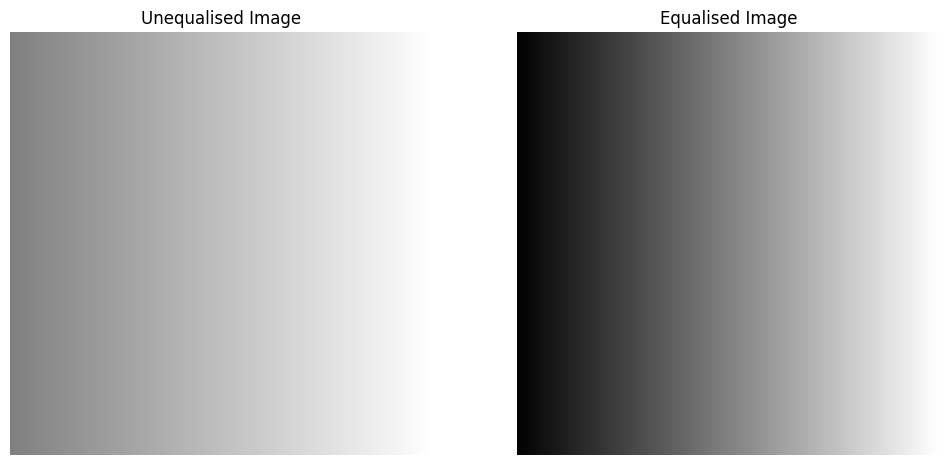

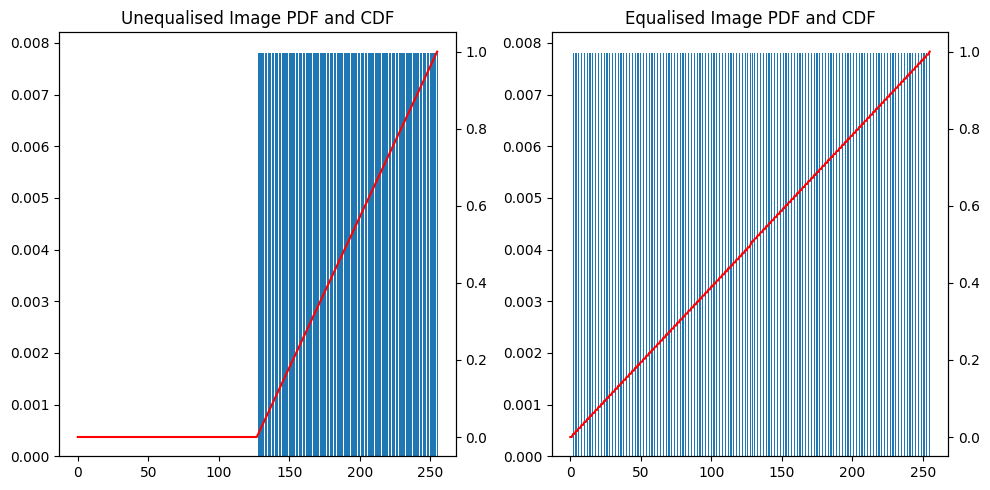

In [ ]:
image = np.array([[i+128 for i in range(128)] for i in range(128)]).astype('uint8')
new_image, new_histogram, old_histogram = EqualiseImage(image, display_histogram=True, display_images=True)

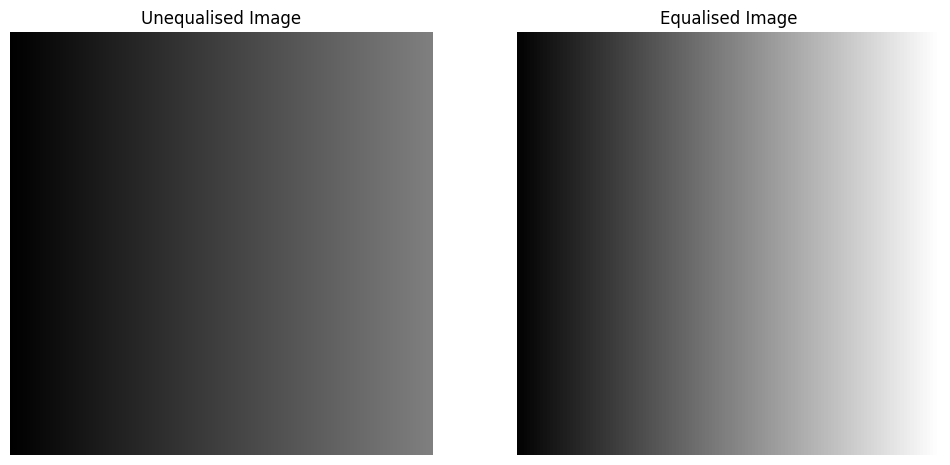

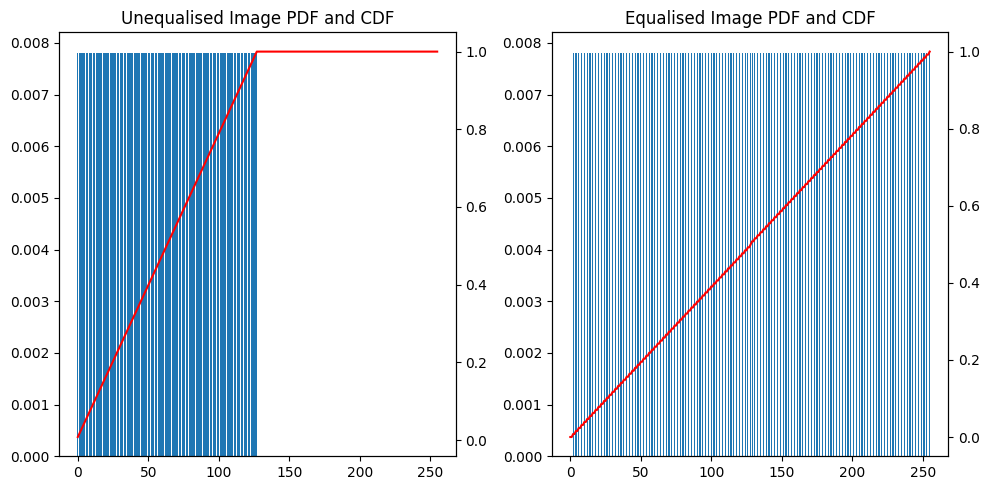

In [ ]:
image = np.array([[i for i in range(128)] for i in range(128)]).astype('uint8')
new_image, new_histogram, old_histogram = EqualiseImage(image, display_histogram=True, display_images=True)

### Performing Equalisation on the given images

Here I read and perform Equalisation on the images, that were given for this assignment. the below code segment will read and display all the images that were given to us.

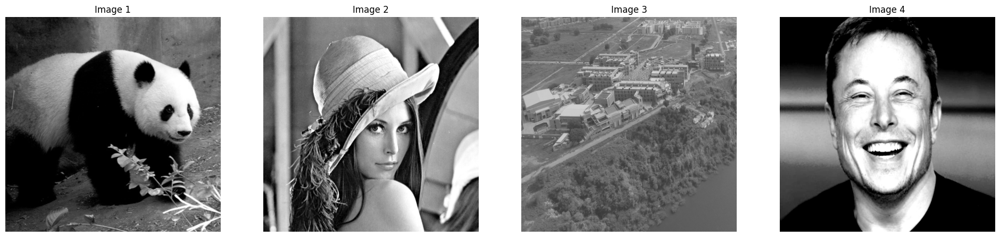

In [ ]:
img1 = GetImagePixelValues('grey_1.png')
img2 = GetImagePixelValues('grey_2.png')
img3 = GetImagePixelValues('grey_3.png')
img4 = GetImagePixelValues('grey_4.png')

DisplayImages([img1, img2, img3, img4], ["Image 1", "Image 2", "Image 3", "Image 4"])

Now we can perform Equalisation on the given images, and then display them. **Note that the red line is the CDF and the blue bars are the PMFs**

<IPython.core.display.Javascript object>

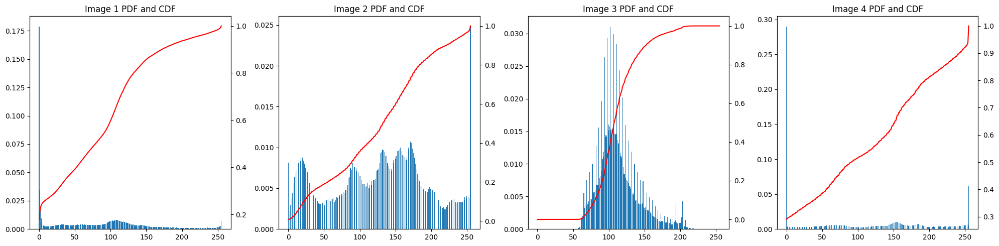

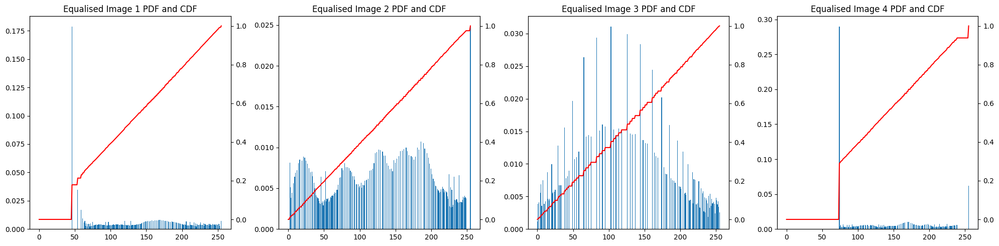

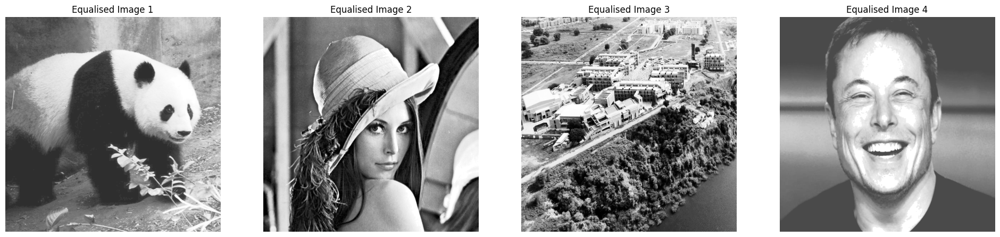

In [ ]:
output.no_vertical_scroll() # This will disable the scrollbar for this cell's output
equalised_image1, equalised_histogram_image1, original_histogram1 = EqualiseImage(img1)
equalised_image2, equalised_histogram_image2, original_histogram2 = EqualiseImage(img2)
equalised_image3, equalised_histogram_image3, original_histogram3 = EqualiseImage(img3)
equalised_image4, equalised_histogram_image4, original_histogram4 = EqualiseImage(img4)

PlotHistograms([original_histogram1, original_histogram2, original_histogram3, original_histogram4], ["Image 1 PDF and CDF", "Image 2 PDF and CDF", "Image 3 PDF and CDF", "Image 4 PDF and CDF"])
PlotHistograms([equalised_histogram_image1, equalised_histogram_image2, equalised_histogram_image3, equalised_histogram_image4], ["Equalised Image 1 PDF and CDF", "Equalised Image 2 PDF and CDF", "Equalised Image 3 PDF and CDF", "Equalised Image 4 PDF and CDF"])
DisplayImages([equalised_image1, equalised_image2, equalised_image3, equalised_image4], ["Equalised Image 1", "Equalised Image 2", "Equalised Image 3", "Equalised Image 4"])

As you can see the final CDF of all the images is almost that of a **uniform distribution which is as expected from the image equalisation algorithm.**

## Histogram Matching

In the process of histogram matching, we transform the histogram distribution of the source image to the target histogram distribution. We do this on the Equalised images of the source and the target.

The process of Histogram Matching is as follows:
1. After equalising the images, we get the equalised image and the histogram for that same image. Now we can perform matching on these 2 images.
2. We find the CDF for the new histograms (both the source and the target).
3. For each pixel value $i$ we can find the pixel which $i$ maps to. For this we find the pixel value $j$ in the target image such that the CDF values of both $i$ in the source image and $j$ in the target image is as close to each other as possible. Hence $i$ is mapped to $j$ ($i \rightarrow j$).
4. Now after we have these mappings, we use this to modify the source image. Let $i$ be the image pixel value at the given point. We update the value at that same position to the value that $i$ maps to. After doing this for all the Pixel values, we have our final image.

In [ ]:
def HistogramMatching(src_image, eq_src_histogram, eq_targ_histogram, display_histogram=False):
  src_cdf = np.cumsum(eq_src_histogram)
  targ_cdf = np.cumsum(eq_targ_histogram)
  mapping = np.zeros(256) - 1 # Which pixel does i map to by default everything is set to -1 which is unassigned
  for i in range(256):
    current_targ = src_cdf[i]

    if current_targ <= eq_targ_histogram[0]:
      mapping[i] = 0
      continue

    best = 0
    for j in range(256):
      if abs(targ_cdf[best] - current_targ) > abs(targ_cdf[j] - current_targ):
        best = j

    mapping[i] = best

  matched_image = np.zeros(src_image.shape, dtype='uint8')
  for i in range(src_image.shape[0]):
    for j in range(src_image.shape[1]):
      matched_image[i, j] = mapping[src_image[i, j]]

  matched_histogram = np.zeros(256)

  for i in range(src_image.shape[0]):
    for j in range(src_image.shape[1]):
      matched_histogram[matched_image[i, j]] += 1

  if display_histogram:
    PlotHistograms([eq_src_histogram, eq_targ_histogram, matched_histogram], ["Source Image", "Target Image", "Matched Image"])

  return matched_image, mapping, matched_histogram

### Observations

Let us take the last 2 images to undestand what happens in the matching algorithm. We will apply the matching algorithm without doing equalisation to get a better sense of how the histogram is changing.

From here you can see that the Histogram Matching algorithm makes the CDF of the source image similar to that of the target image. This result is as expected and hence it verifies that the implemented algorithm is correct.

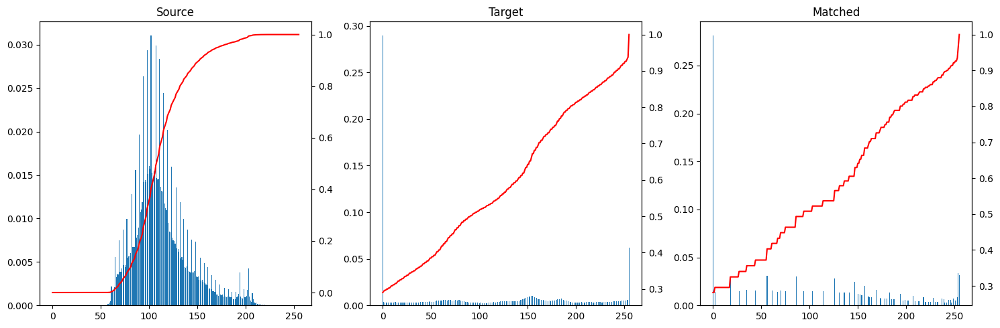

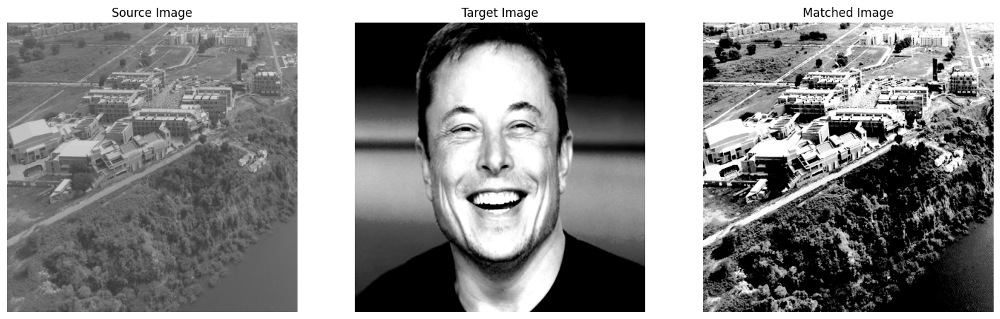

In [ ]:
matched_image, mapping, matched_histogram = HistogramMatching(img3, original_histogram3, original_histogram4)
PlotHistograms([original_histogram3, original_histogram4, matched_histogram], ['Source', 'Target', 'Matched'])
PrintAnswer(img3, img4, matched_image)

### Applying Histogram Matching on the given images

In this section, I apply histogram matching on the given images.

#### Histogram Matching on Original Images (Without equalisation)

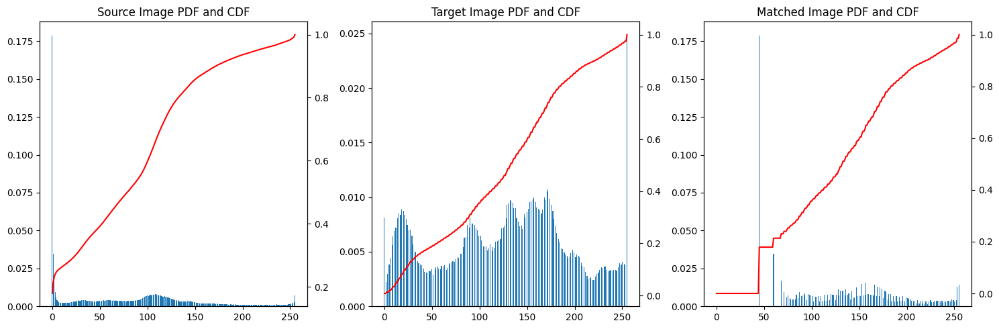

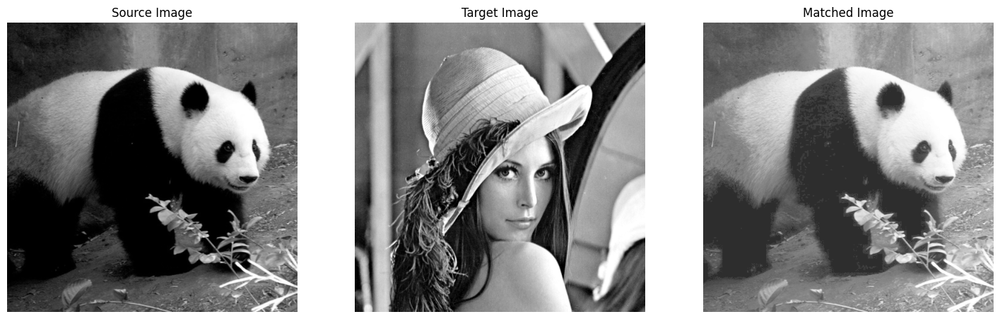

In [ ]:
matched_image_without_eq1, mapping_without_eq1, matched_histogram_without_eq1 = HistogramMatching(img1, original_histogram1, original_histogram2)
PlotHistograms([original_histogram1, original_histogram2, matched_histogram_without_eq1], ["Source Image PDF and CDF", "Target Image PDF and CDF", "Matched Image PDF and CDF"])
PrintAnswer(img1, img2, matched_image_without_eq1)

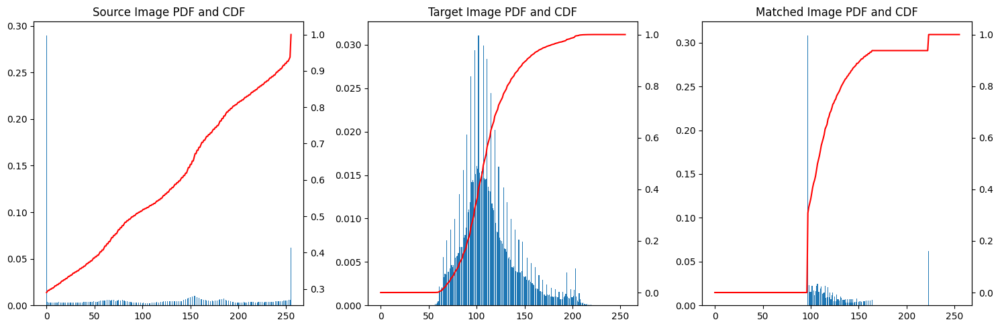

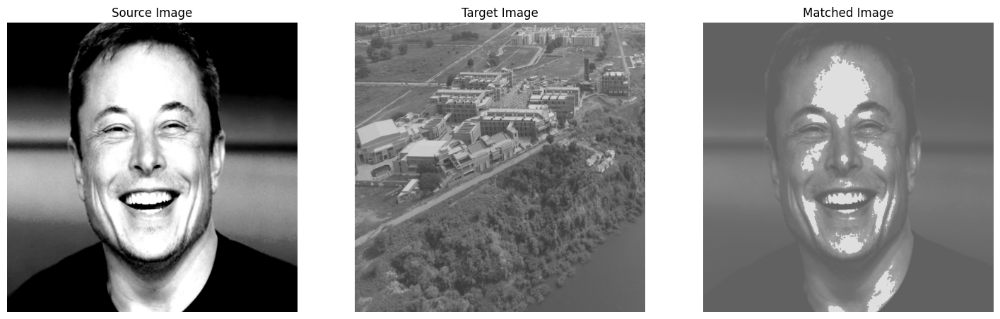

In [ ]:
matched_image_without_eq2, mapping_without_eq2, matched_histogram_without_eq2 = HistogramMatching(img4, original_histogram4, original_histogram3)
PlotHistograms([original_histogram4, original_histogram3, matched_histogram_without_eq2], ["Source Image PDF and CDF", "Target Image PDF and CDF", "Matched Image PDF and CDF"])
PrintAnswer(img4, img3, matched_image_without_eq2)

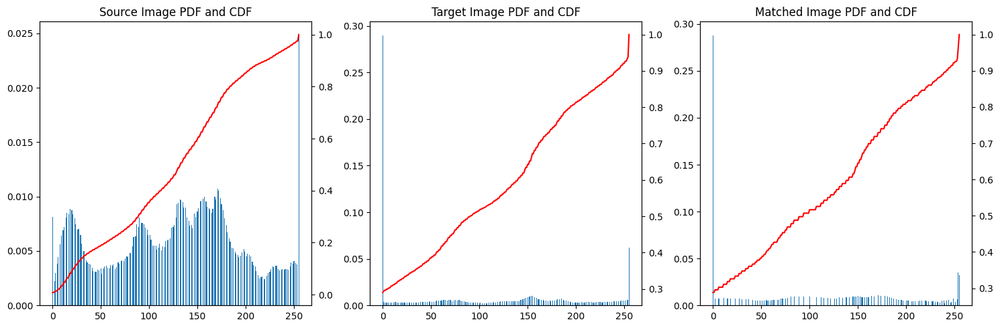

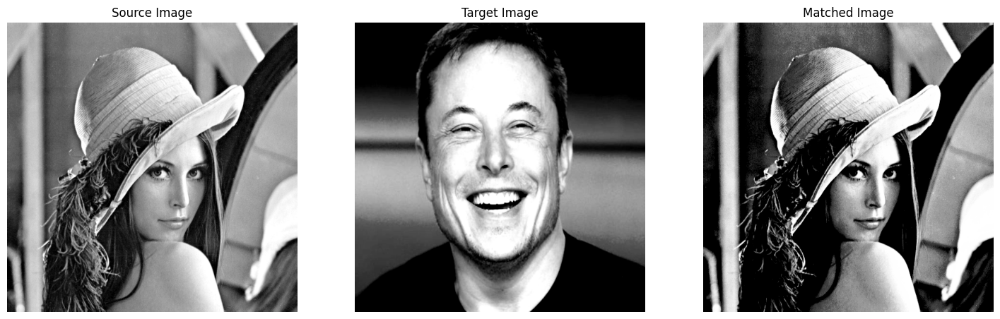

In [ ]:
matched_image_without_eq3, mapping_without_eq3, matched_histogram_without_eq3 = HistogramMatching(img2, original_histogram2, original_histogram4)
PlotHistograms([original_histogram2, original_histogram4, matched_histogram_without_eq3], ["Source Image PDF and CDF", "Target Image PDF and CDF", "Matched Image PDF and CDF"])
PrintAnswer(img2, img4, matched_image_without_eq3)

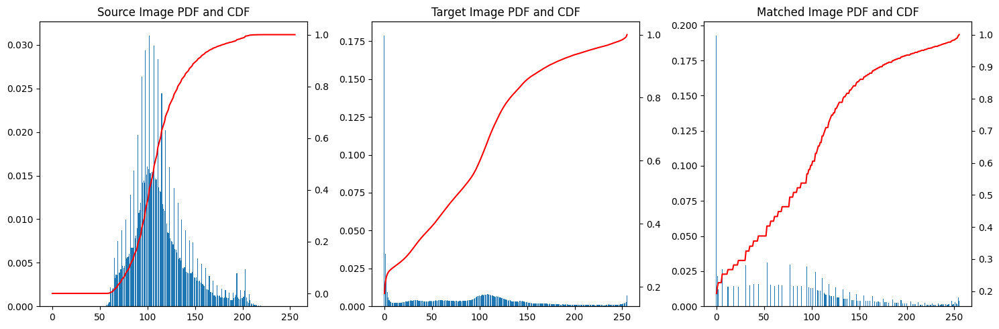

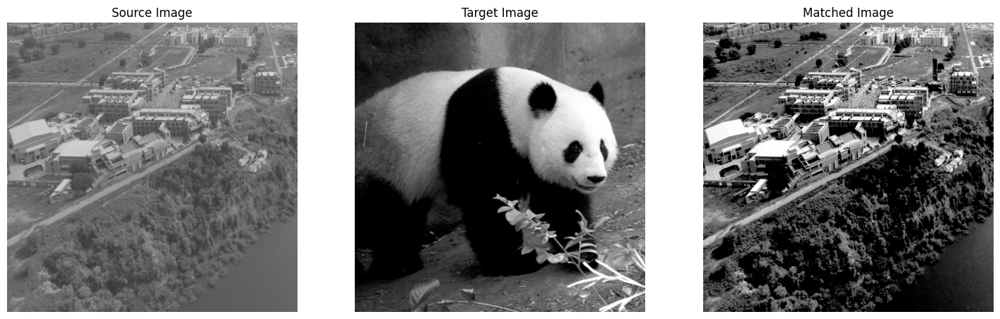

In [ ]:
matched_image_without_eq4, mapping_without_eq4, matched_histogram_without_eq4 = HistogramMatching(img3, original_histogram3, original_histogram1)
PlotHistograms([original_histogram3, original_histogram1, matched_histogram_without_eq4], ["Source Image PDF and CDF", "Target Image PDF and CDF", "Matched Image PDF and CDF"])
PrintAnswer(img3, img1, matched_image_without_eq4)

#### Histogram Matching on Equalised Images

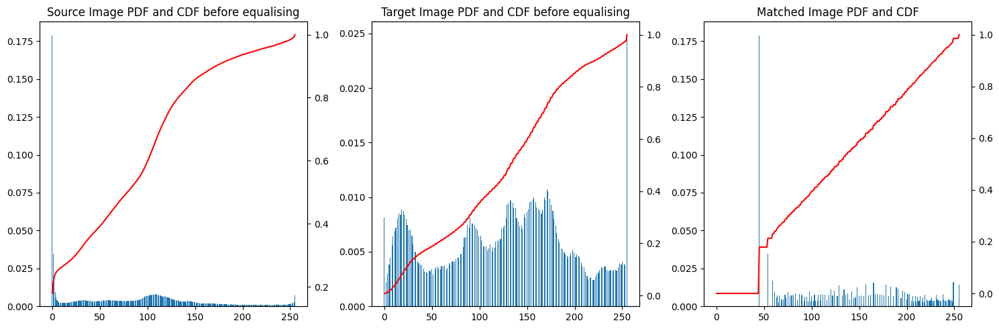

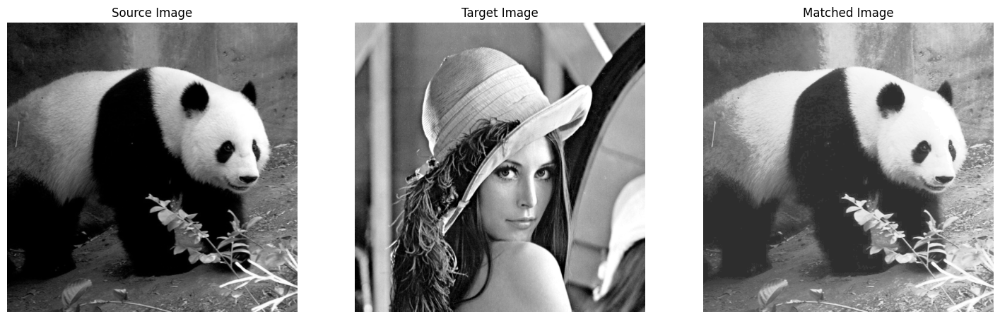

In [ ]:
matched_image_with_eq1, mapping_with_eq1, matched_histogram_with_eq1 = HistogramMatching(equalised_image1, equalised_histogram_image1, equalised_histogram_image2)
PlotHistograms([original_histogram1, original_histogram2, matched_histogram_with_eq1], ["Source Image PDF and CDF before equalising", "Target Image PDF and CDF before equalising", "Matched Image PDF and CDF"])
PrintAnswer(img1, img2, matched_image_with_eq1)

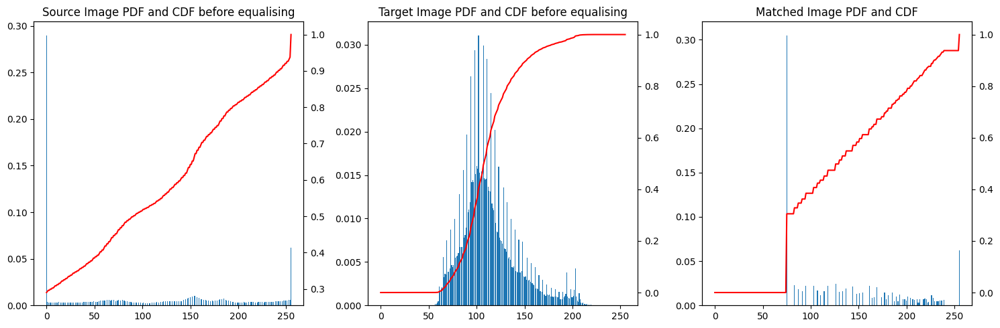

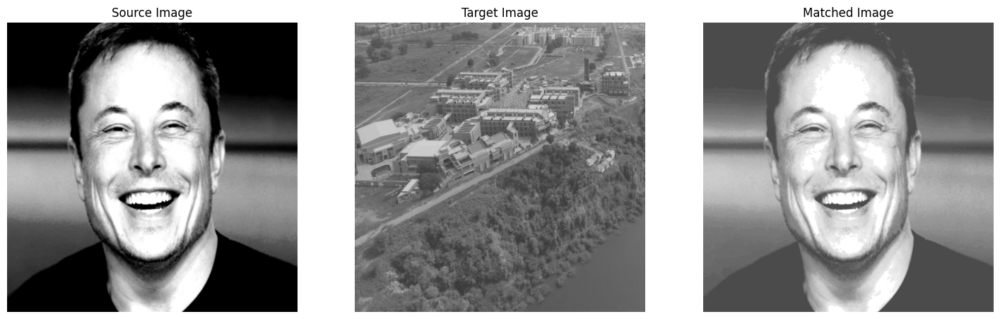

In [ ]:
matched_image_with_eq2, mapping_with_eq2, matched_histogram_with_eq2 = HistogramMatching(equalised_image4, equalised_histogram_image4, equalised_histogram_image3)
PlotHistograms([original_histogram4, original_histogram3, matched_histogram_with_eq2], ["Source Image PDF and CDF before equalising", "Target Image PDF and CDF before equalising", "Matched Image PDF and CDF"])
PrintAnswer(img4, img3, matched_image_with_eq2)

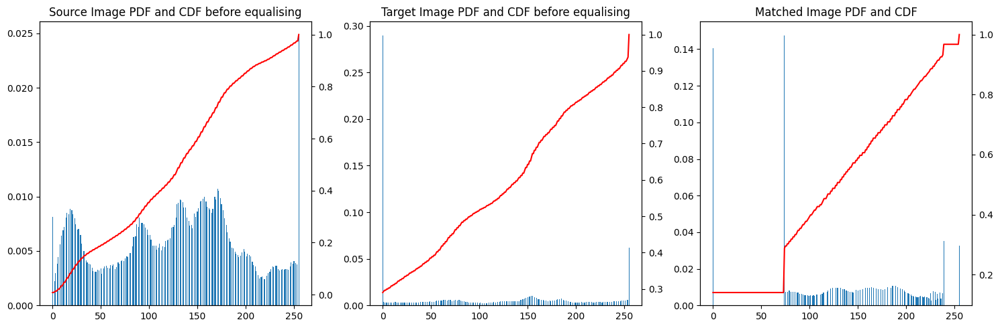

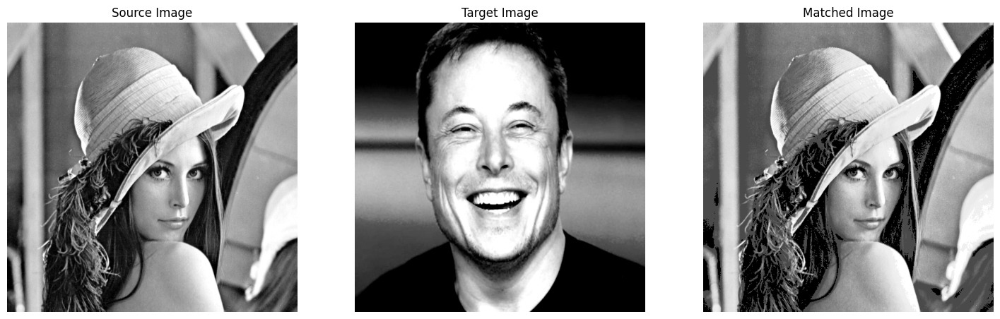

In [ ]:
matched_image_with_eq3, mapping_with_eq3, matched_histogram_with_eq3 = HistogramMatching(equalised_image2, equalised_histogram_image2, equalised_histogram_image4)
PlotHistograms([original_histogram2, original_histogram4, matched_histogram_with_eq3], ["Source Image PDF and CDF before equalising", "Target Image PDF and CDF before equalising", "Matched Image PDF and CDF"])
PrintAnswer(img2, img4, matched_image_with_eq3)

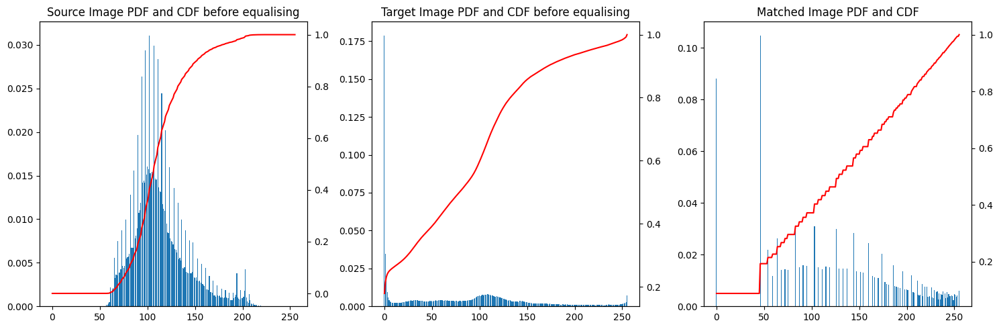

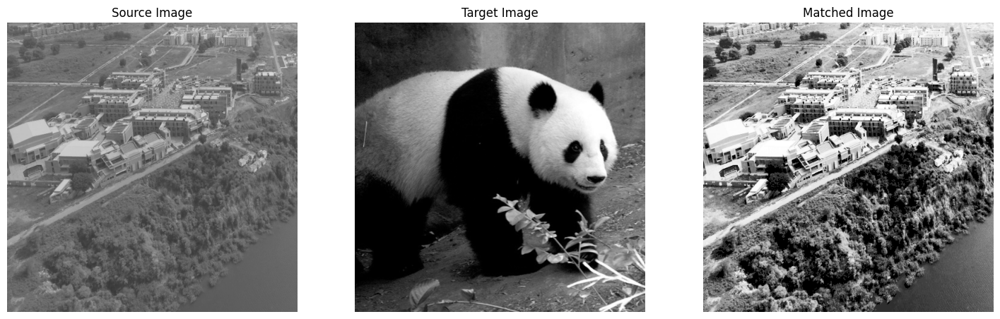

In [ ]:
matched_image_with_eq4, mapping_with_eq4, matched_histogram_with_eq4 = HistogramMatching(equalised_image3, equalised_histogram_image3, equalised_histogram_image1)
PlotHistograms([original_histogram3, original_histogram1, matched_histogram_with_eq4], ["Source Image PDF and CDF before equalising", "Target Image PDF and CDF before equalising", "Matched Image PDF and CDF"])
PrintAnswer(img3, img1, matched_image_with_eq4)

#### Histogram matching with equalising the source and the original image for the target

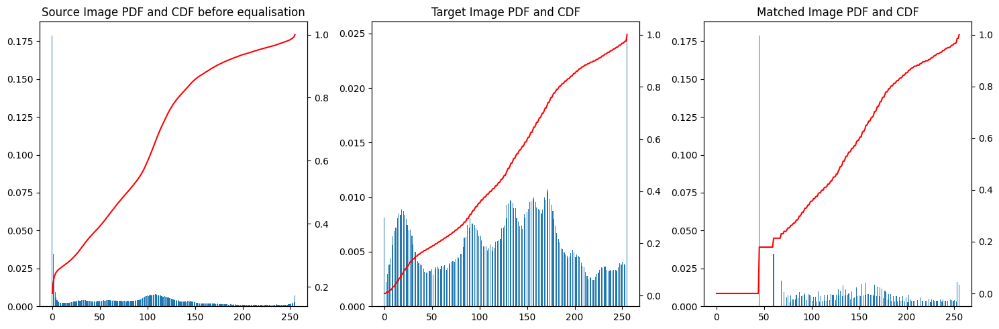

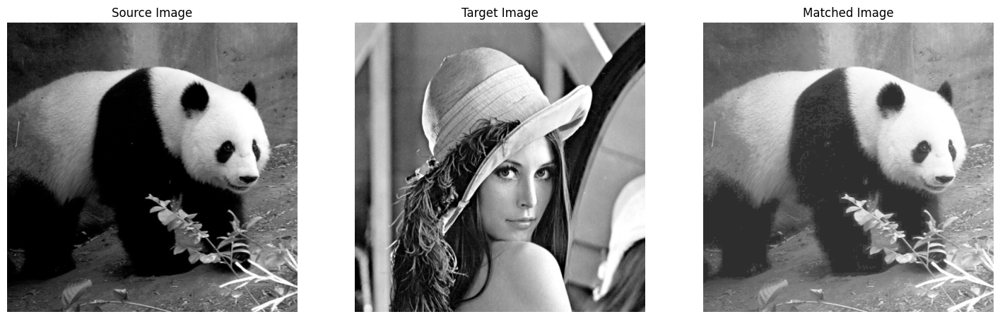

In [ ]:
matched_image_with_eq_only_one_1, mapping_with_eq_only_one_1, matched_histogram_with_eq_only_one_1 = HistogramMatching(equalised_image1, equalised_histogram_image1, original_histogram2)
PlotHistograms([original_histogram1, original_histogram2, matched_histogram_with_eq_only_one_1], ["Source Image PDF and CDF before equalisation", "Target Image PDF and CDF", "Matched Image PDF and CDF"])
PrintAnswer(img1, img2, matched_image_with_eq_only_one_1)

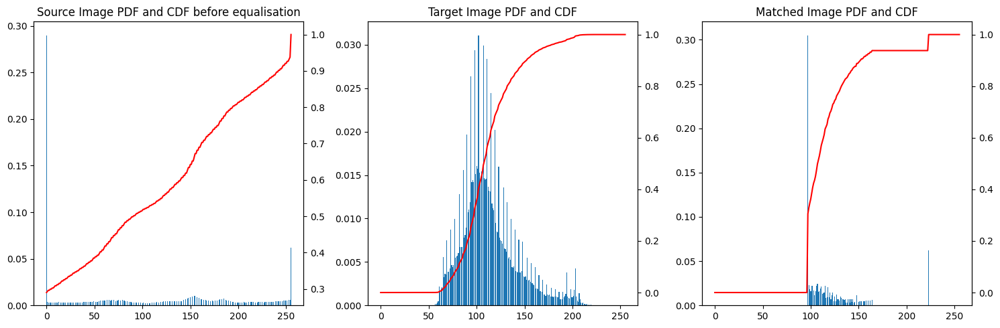

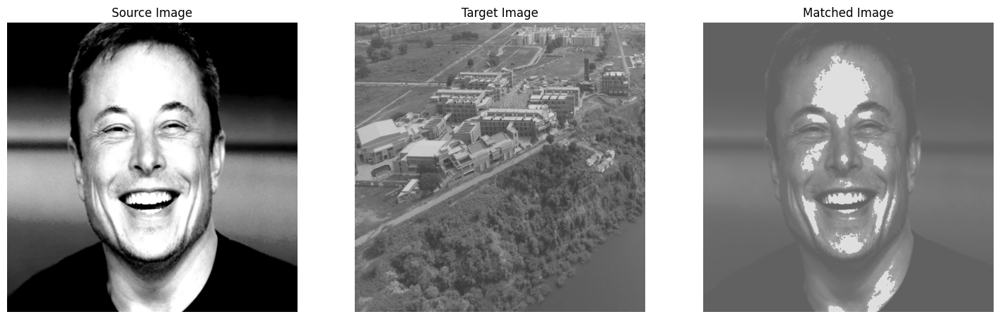

In [ ]:
matched_image_with_eq_only_one_2, mapping_with_eq_only_one_2, matched_histogram_with_eq_only_one_2 = HistogramMatching(equalised_image4, equalised_histogram_image4, original_histogram3)
PlotHistograms([original_histogram4, original_histogram3, matched_histogram_with_eq_only_one_2], ["Source Image PDF and CDF before equalisation", "Target Image PDF and CDF", "Matched Image PDF and CDF"])
PrintAnswer(img4, img3, matched_image_with_eq_only_one_2)

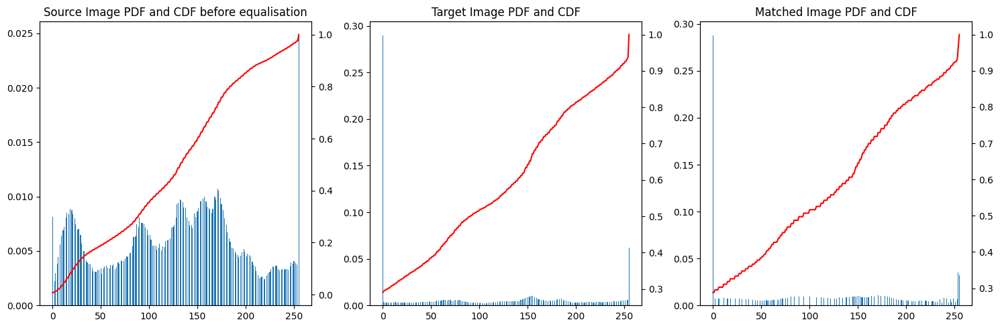

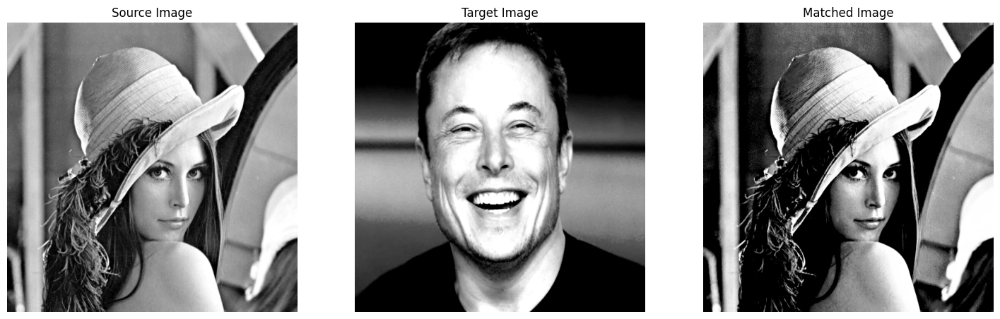

In [ ]:
matched_image_with_eq_only_one_3, mapping_with_eq_only_one_3, matched_histogram_with_eq_only_one_3 = HistogramMatching(equalised_image2, equalised_histogram_image2, original_histogram4)
PlotHistograms([original_histogram2, original_histogram4, matched_histogram_with_eq_only_one_3], ["Source Image PDF and CDF before equalisation", "Target Image PDF and CDF", "Matched Image PDF and CDF"])
PrintAnswer(img2, img4, matched_image_with_eq_only_one_3)

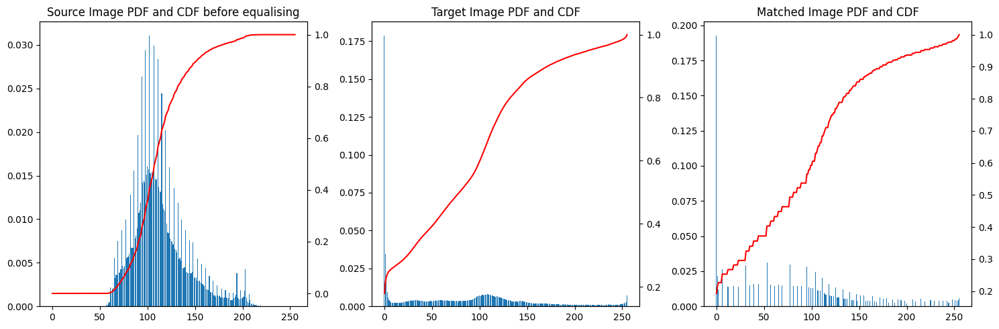

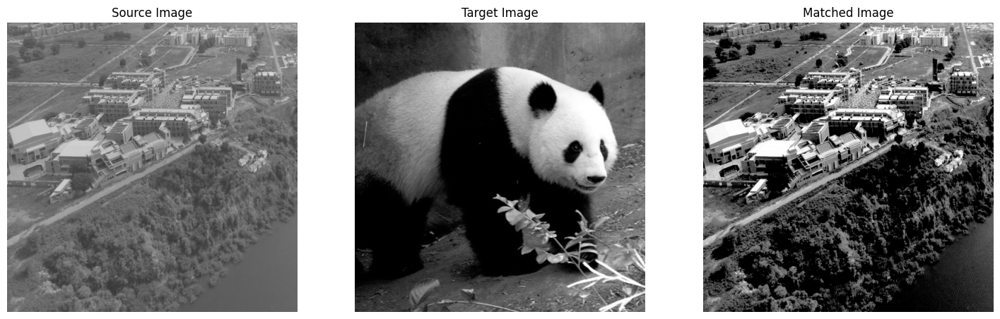

In [ ]:
matched_image_with_eq_only_one_4, mapping_with_eq_only_one_4, matched_histogram_with_eq_only_one_4 = HistogramMatching(equalised_image3, equalised_histogram_image3, original_histogram1)
PlotHistograms([original_histogram3, original_histogram1, matched_histogram_with_eq_only_one_4], ["Source Image PDF and CDF before equalising", "Target Image PDF and CDF", "Matched Image PDF and CDF"])
PrintAnswer(img3, img1, matched_image_with_eq_only_one_4)

## Saving the images

In this section, I simply save all the images.

In [ ]:
SaveImage('Equalised_Image1.png', equalised_image1)
SaveImage('Equalised_Image2.png', equalised_image2)
SaveImage('Equalised_Image3.png', equalised_image3)
SaveImage('Equalised_Image4.png', equalised_image4)

SaveImage('Matched_Image_without_eq1.png', matched_image_without_eq1)
SaveImage('Matched_Image_without_eq2.png', matched_image_without_eq2)
SaveImage('Matched_Image_without_eq3.png', matched_image_without_eq3)
SaveImage('Matched_Image_without_eq4.png', matched_image_without_eq4)

SaveImage('Matched_Image_with_eq1.png', matched_image_with_eq1)
SaveImage('Matched_Image_with_eq2.png', matched_image_with_eq2)
SaveImage('Matched_Image_with_eq3.png', matched_image_with_eq3)
SaveImage('Matched_Image_with_eq4.png', matched_image_with_eq4)

SaveImage('Matched_Image_with_eq_only_one_1.png', matched_image_with_eq_only_one_1)
SaveImage('Matched_Image_with_eq_only_one_2.png', matched_image_with_eq_only_one_2)
SaveImage('Matched_Image_with_eq_only_one_3.png', matched_image_with_eq_only_one_3)
SaveImage('Matched_Image_with_eq_only_one_4.png', matched_image_with_eq_only_one_4)

# Final Answers
Here and the final images. I have displayed the following:

* The equalised images
* The matched images without equalising both the source and the target
* The matched images with equalising both the source and the target

<IPython.core.display.Javascript object>

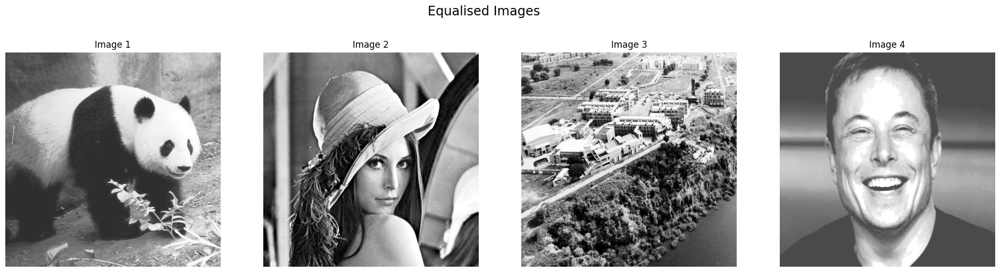

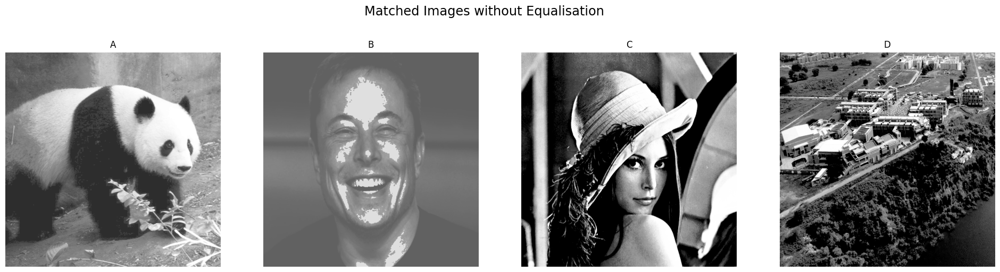

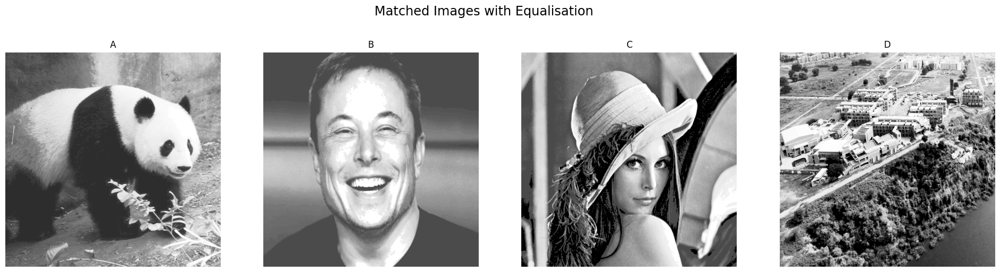

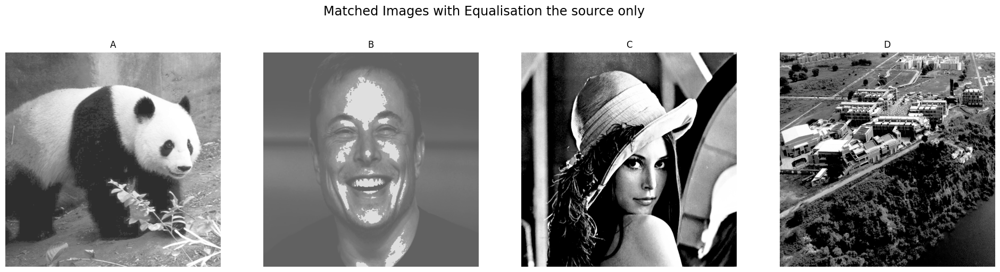

In [ ]:
output.no_vertical_scroll() # This will disable the scrollbar for this cell's output

DisplayImages([equalised_image1, equalised_image2, equalised_image3, equalised_image4], ["Image 1", "Image 2", "Image 3", "Image 4"], "Equalised Images")
DisplayImages([matched_image_without_eq1, matched_image_without_eq2, matched_image_without_eq3, matched_image_without_eq4], ["A", "B", "C", "D"], "Matched Images without Equalisation")
DisplayImages([matched_image_with_eq1, matched_image_with_eq2, matched_image_with_eq3, matched_image_with_eq4], ["A", "B", "C", "D"], "Matched Images with Equalisation")
DisplayImages([matched_image_with_eq_only_one_1, matched_image_with_eq_only_one_2, matched_image_with_eq_only_one_3, matched_image_with_eq_only_one_4], ["A", "B", "C", "D"], "Matched Images with Equalisation the source only")

# References

1. “Histogram matching,” _Wikipedia_, Feb. 07, 2022. https://en.wikipedia.org/wiki/Histogram_matching

2. “Histogram matching with OpenCV, scikit-image, and Python,” _GeeksforGeeks_, Feb. 04, 2022. https://www.geeksforgeeks.org/histogram-matching-with-opencv-scikit-image-and-python/

3. “OpenCV: Image file reading and writing,” _OpenCV_. https://docs.opencv.org/4.x/d4/da8/group__imgcodecs.html

4. “Google Colaboratory: Is there any way to expand the height of the result cell of running a code?,” _Stack Overflow_. https://stackoverflow.com/questions/55546869/google-colaboratory-is-there-any-way-to-expand-the-height-of-the-result-cell-of (accessed Mar. 02, 2024).

